In [12]:
import glob
import os
import io
import sys
import shutil
import glob
import sqlite3
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from time import time
from PIL import Image, ImageFilter, ImageChops
import mediapy as media

In [35]:
# Delete working image, and create a new one
!rm -rf working
!mkdir working
!mkdir working/tmp_input

secction_id = '1535AC7C-7030-431C-8E1F-AF0DBEF80A9B'
connection = sqlite3.connect(f'./split_dbs/db_session_{secction_id}.sqlite')

# Get all data
cursor = connection.cursor()
cursor.execute("SELECT image_blob FROM maptodon_raw WHERE ROWID % 10 = 0")
results = cursor.fetchall()

# Process the search results
image_hashes = {}
if len(results) > 0:
	for i, row in enumerate(results):
		image_data = row[0]

		# Save to working directory
		image = Image.open(io.BytesIO(image_data))

		image.save(f"./working/tmp_input/image_{i:05d}.png")
	print("Saved " + str(len(results)) + " images to working directory.")
else:
	print("No results found.")

# Close the database connection
connection.close()

Saved 82 images to working directory.


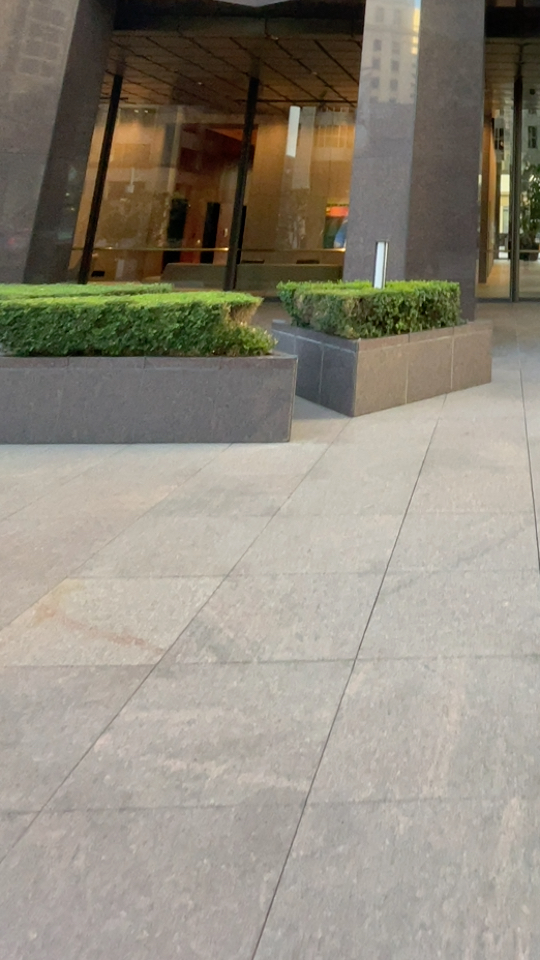

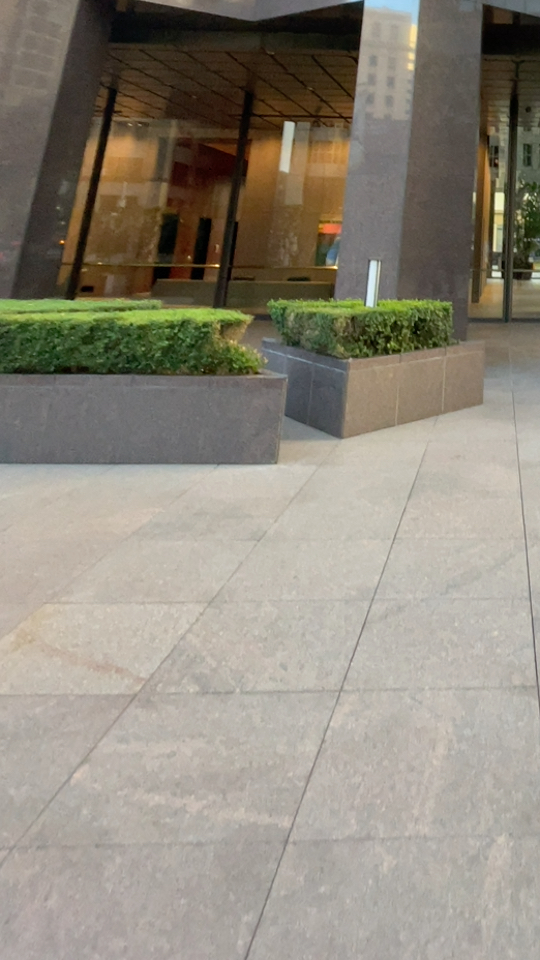

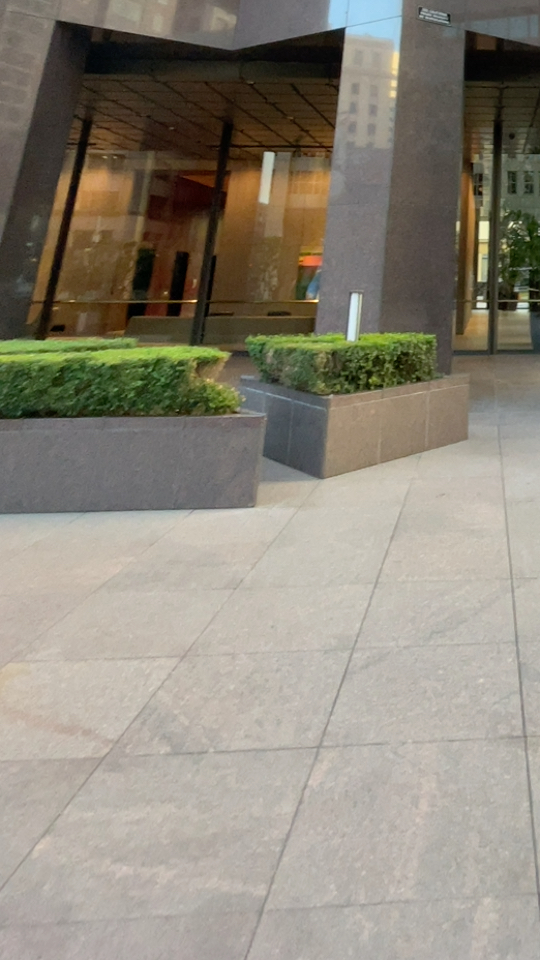

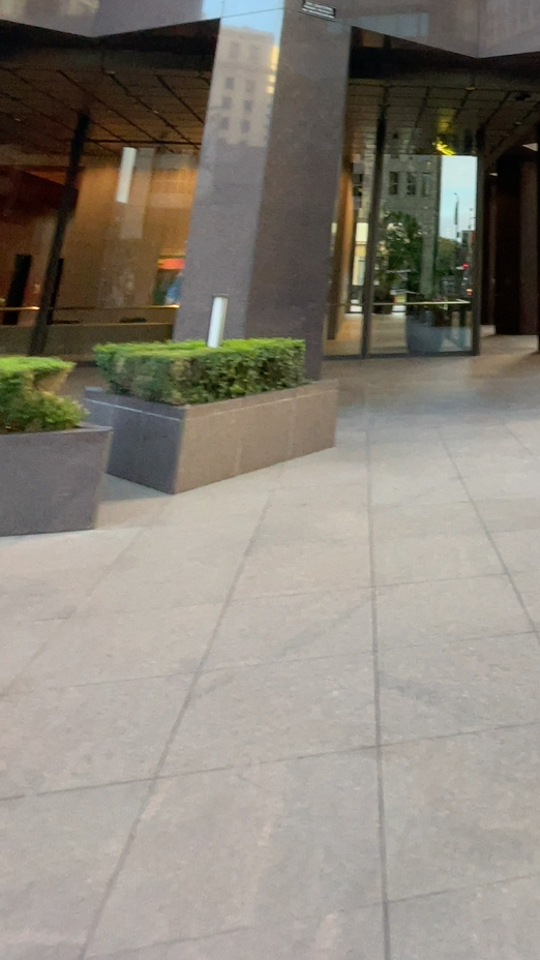

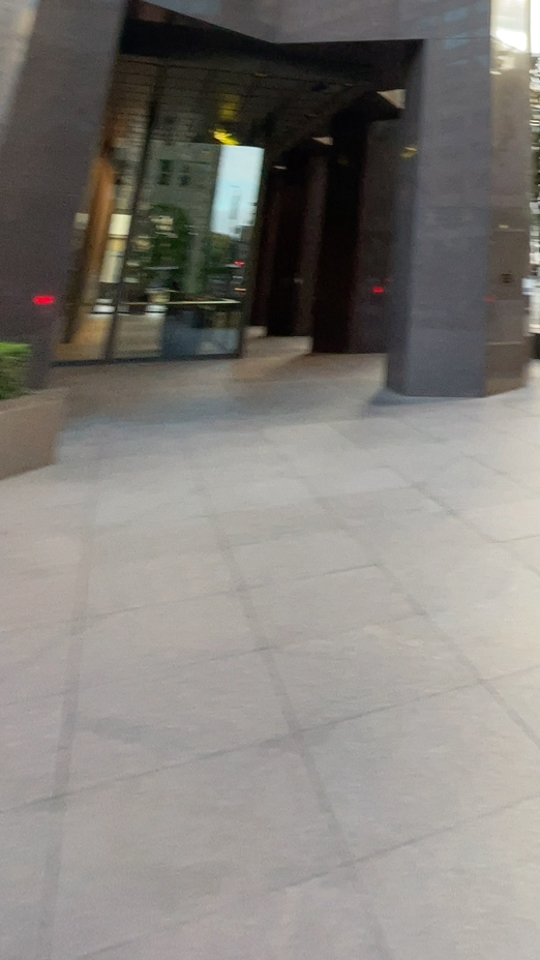

In [22]:
for i in range(0, 100, 20):
	image = Image.open(f"./working/tmp_input/image_{i:05d}.png")
	display(image)

In [23]:
from PIL import Image
import numpy as np
import os

def is_blurry(image, threshold):
    """
    Determine if the image is blurry using the variance of the Laplacian operator.
    :param image: The image as a numpy array.
    :param threshold: The threshold to determine if the image is blurry.
    :return: True if the image is blurry, False otherwise.
    """
    kernel = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
    laplacian = np.abs(np.convolve(image.flatten(), kernel.flatten(), 'same'))
    variance = np.var(laplacian)
    return variance < threshold

def delete_blurry_images(directory, threshold):
    """
    Delete all blurry images in the specified directory.
    :param directory: The directory where the images are stored.
    :param threshold: The threshold to determine if an image is blurry.
    """
    for filename in os.listdir(directory):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            file_path = os.path.join(directory, filename)
            image = Image.open(file_path).convert('L')  # convert image to grayscale
            image = np.array(image)
            
            if is_blurry(image, threshold):
                os.remove(file_path)
                print(f"Deleted {filename} as it was blurry.")

# Example usage:
# Set your own values for these variables
image_directory = "./working/tmp_input"
blur_threshold = 700  # Adjust the threshold as per your requirement

delete_blurry_images(image_directory, blur_threshold)


Deleted image_00532.png as it was blurry.
Deleted image_00254.png as it was blurry.
Deleted image_00526.png as it was blurry.
Deleted image_01176.png as it was blurry.
Deleted image_01162.png as it was blurry.
Deleted image_01189.png as it was blurry.
Deleted image_00297.png as it was blurry.
Deleted image_00283.png as it was blurry.
Deleted image_01348.png as it was blurry.
Deleted image_00056.png as it was blurry.
Deleted image_00042.png as it was blurry.
Deleted image_01374.png as it was blurry.
Deleted image_01412.png as it was blurry.
Deleted image_01406.png as it was blurry.
Deleted image_01360.png as it was blurry.
Deleted image_00095.png as it was blurry.
Deleted image_00081.png as it was blurry.
Deleted image_01228.png as it was blurry.
Deleted image_01200.png as it was blurry.
Deleted image_00678.png as it was blurry.
Deleted image_01214.png as it was blurry.
Deleted image_00687.png as it was blurry.
Deleted image_00446.png as it was blurry.
Deleted image_00320.png as it was 

Found 410 images.


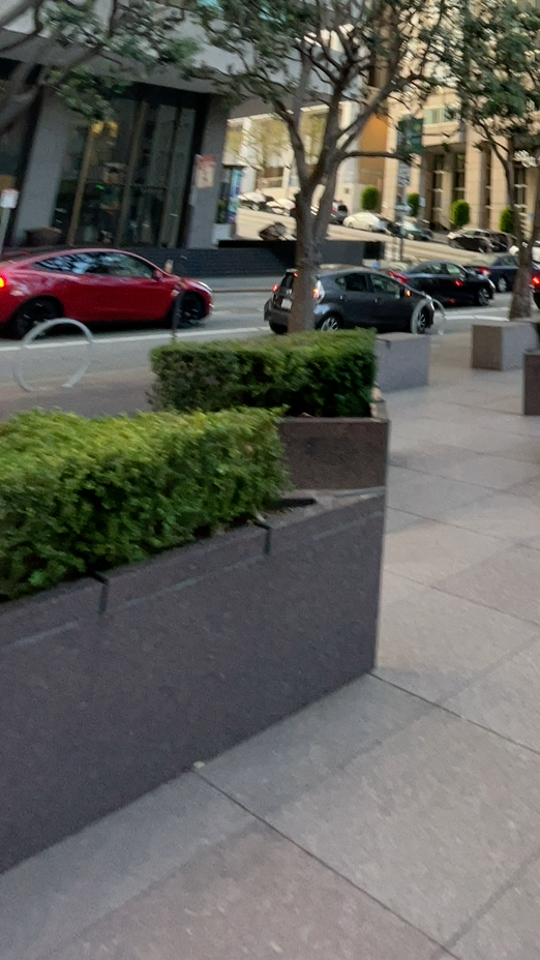

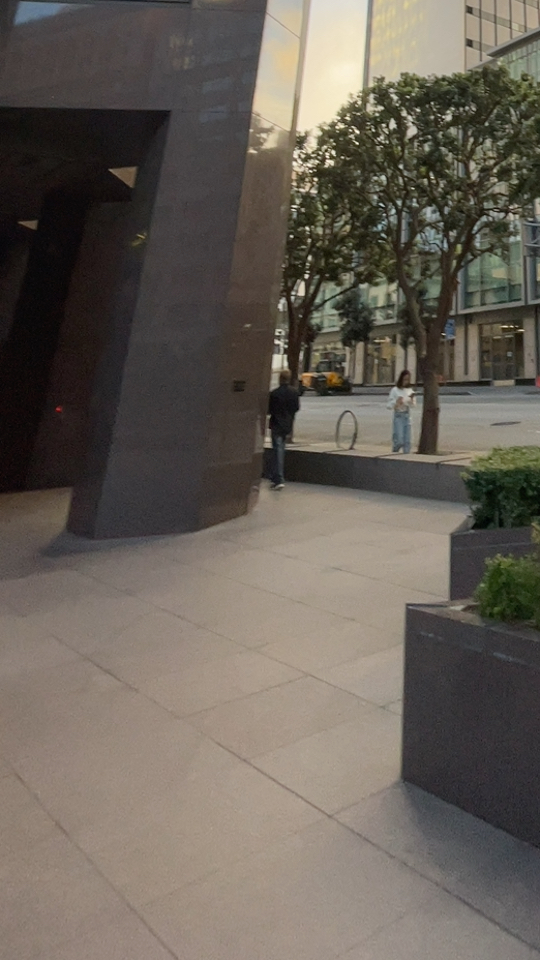

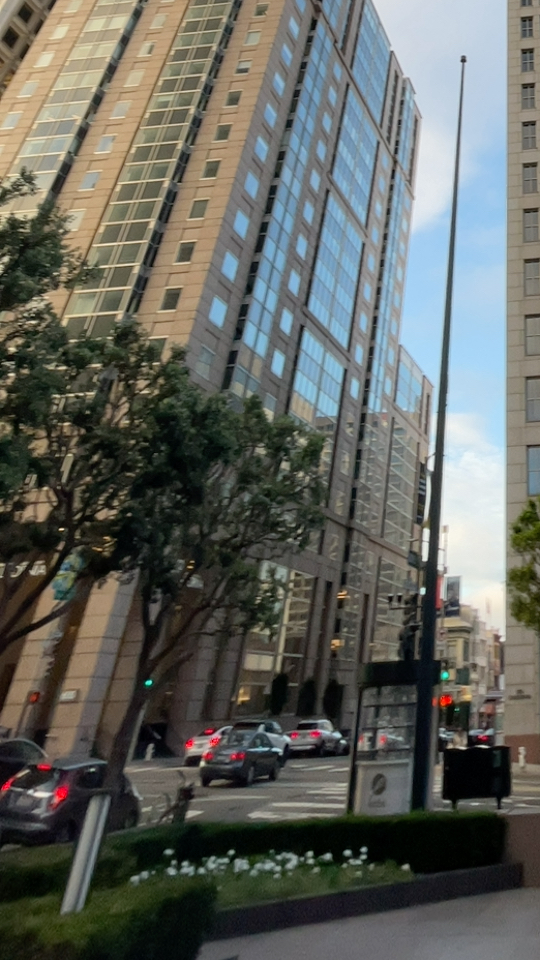

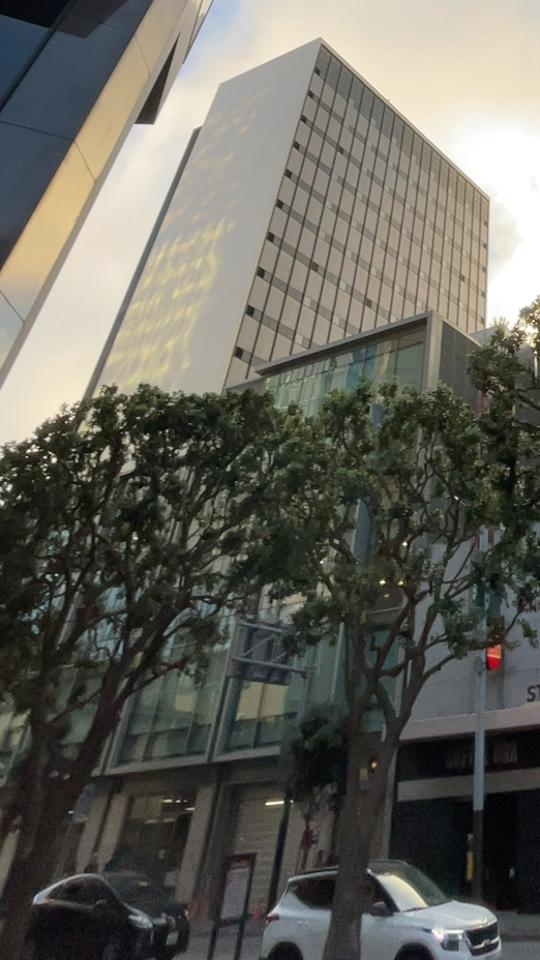

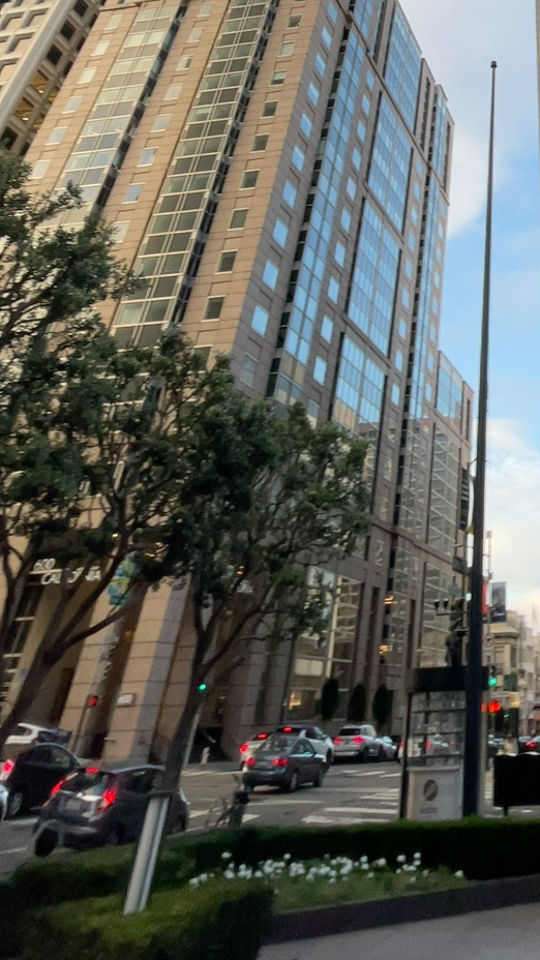

In [24]:
images = glob.glob("./working/tmp_input/*.png")
print("Found " + str(len(images)) + " images.")

for i in range(0, 100, 20):
	image = Image.open(images[i])
	display(image)

In [31]:
!rm -rf ./working/input
!mkdir ./working/input

# Maximum number of images to copy
M = 1000
# M = 100

step = len(images) // M

print("step", step)
print(f"Images will be {len(images) // (1 if step == 0 else step)}")


step 0
Images will be 410


In [33]:

for i, image in enumerate(images):
	if step == 0 or i % step == 0:
		shutil.copy(image, f"./working/input/{i:05d}.png")
images = glob.glob("./working/input/*.png")
print(f"There are {len(images)} images in the working directory.")


There are 410 images in the working directory.


In [34]:
!zip -r ./working/input.zip ./working/input

  adding: working/input/ (stored 0%)
  adding: working/input/00324.png (deflated 0%)
  adding: working/input/00330.png (deflated 0%)
  adding: working/input/00318.png (deflated 0%)
  adding: working/input/00126.png (deflated 0%)
  adding: working/input/00132.png (deflated 0%)
  adding: working/input/00091.png (deflated 0%)
  adding: working/input/00085.png (deflated 0%)
  adding: working/input/00052.png (deflated 0%)
  adding: working/input/00046.png (deflated 0%)
  adding: working/input/00293.png (deflated 0%)
  adding: working/input/00287.png (deflated 0%)
  adding: working/input/00250.png (deflated 0%)
  adding: working/input/00244.png (deflated 0%)
  adding: working/input/00278.png (deflated 0%)
  adding: working/input/00279.png (deflated 0%)
  adding: working/input/00245.png (deflated 0%)
  adding: working/input/00251.png (deflated 0%)
  adding: working/input/00286.png (deflated 0%)
  adding: working/input/00292.png (deflated 0%)
  adding: working/input/00047.png (deflated 0%)
  a